In [1]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16078, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 16078 (delta 6), reused 9 (delta 1), pack-reused 16056
Receiving objects: 100% (16078/16078), 14.64 MiB | 18.09 MiB/s, done.
Resolving deltas: 100% (11038/11038), done.
/content/yolov5


In [4]:
## Install Necessary Dependencies
!pip install -qr requirements.txt  ## -q -> ignore erros

In [6]:
import torch
from IPython.display import Image,clear_output
print("setup complete, using torch %s %s" % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else "CPU"))

setup complete, using torch 2.1.0+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


## Custom Data


In [8]:
%cd /content

/content


In [9]:
!curl -L "https://github.com/Ankitzanzmera/data_repository/raw/main/sign_lang.zip" > sign_data.zip; unzip sign_data.zip;

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 3641k  100 3641k    0     0  2238k      0  0:00:01  0:00:01 --:--:-- 13.1M
Archive:  sign_data.zip
   creating: annotated_data/
  inflating: annotated_data/data.yaml  
   creating: annotated_data/test/
   creating: annotated_data/test/images/
  inflating: annotated_data/test/images/Hello-2037f8b5-8de6-11ee-b0f6-f894c24260f2_jpg.rf.26131f3fc3a69caa3a5637266fda53a1.jpg  
  inflating: annotated_data/test/images/Hello-29edd62d-8de6-11ee-8ffa-f894c24260f2_jpg.rf.0477177bc499d51ae607220897473f90.jpg  
  inflating: annotated_data/test/images/Hello-2c5a1011-8de6-11ee-a099-f894c24260f2_jpg.rf.975e01d77c843664d8a93c182f8b04ae.jpg  
  inflating: annotated_data/test/images/Hello-2ec5ec61-8de6-11ee-b356-f894c24260f2_jpg.rf.27a2a62bb82417f3c28313e4d5a829e4.jpg  


## Model Config

In [13]:
import yaml
with open("/content/annotated_data/data.yaml","r") as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])
print(num_classes)

6


In [14]:
## This model config we'll use
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]

In [19]:
# customize ipython wrtitefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
  with open(line,"w") as f:
    f.write(cell.format(**globals()))

In [20]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [22]:
%%time
%cd /content/yolov5
!python train.py --img 416 --batch 16 --epochs 300 --data "/content/annotated_data/data.yaml" --cfg "/content/yolov5/models/custom_yolov5s.yaml" --weights "yolov5s.pt" --name yolov5_results --cache

/content/yolov5
2023-11-28 14:07:17.733095: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-28 14:07:17.733156: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-28 14:07:17.733194: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=/content/yolov5/models/custom_yolov5s.yaml, data=/content/annotated_data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_

## Evaluate

In [23]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [24]:
!nvidia-smi

Tue Nov 28 14:23:05 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

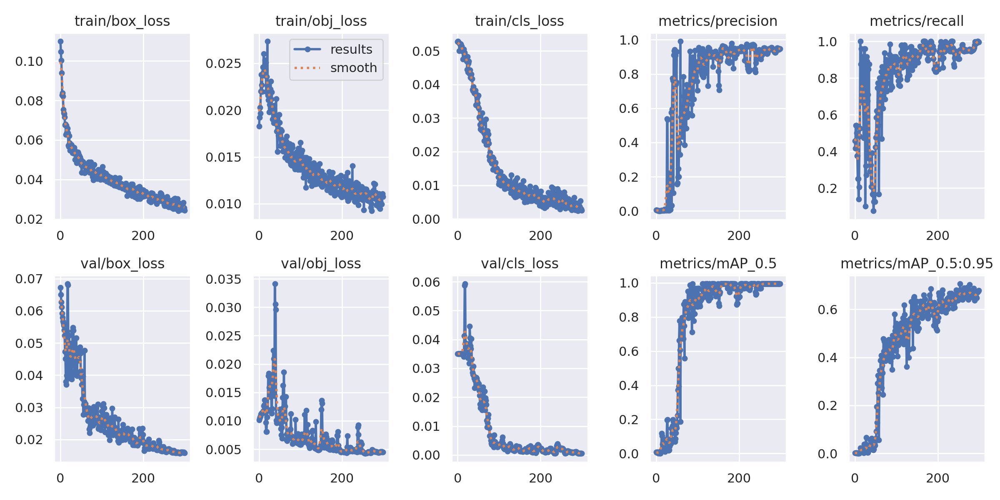

In [25]:
from utils.plots import plot_results
Image(filename = "/content/yolov5/runs/train/yolov5_results2/results.png",width = 1000)

Ground Truth Training Data


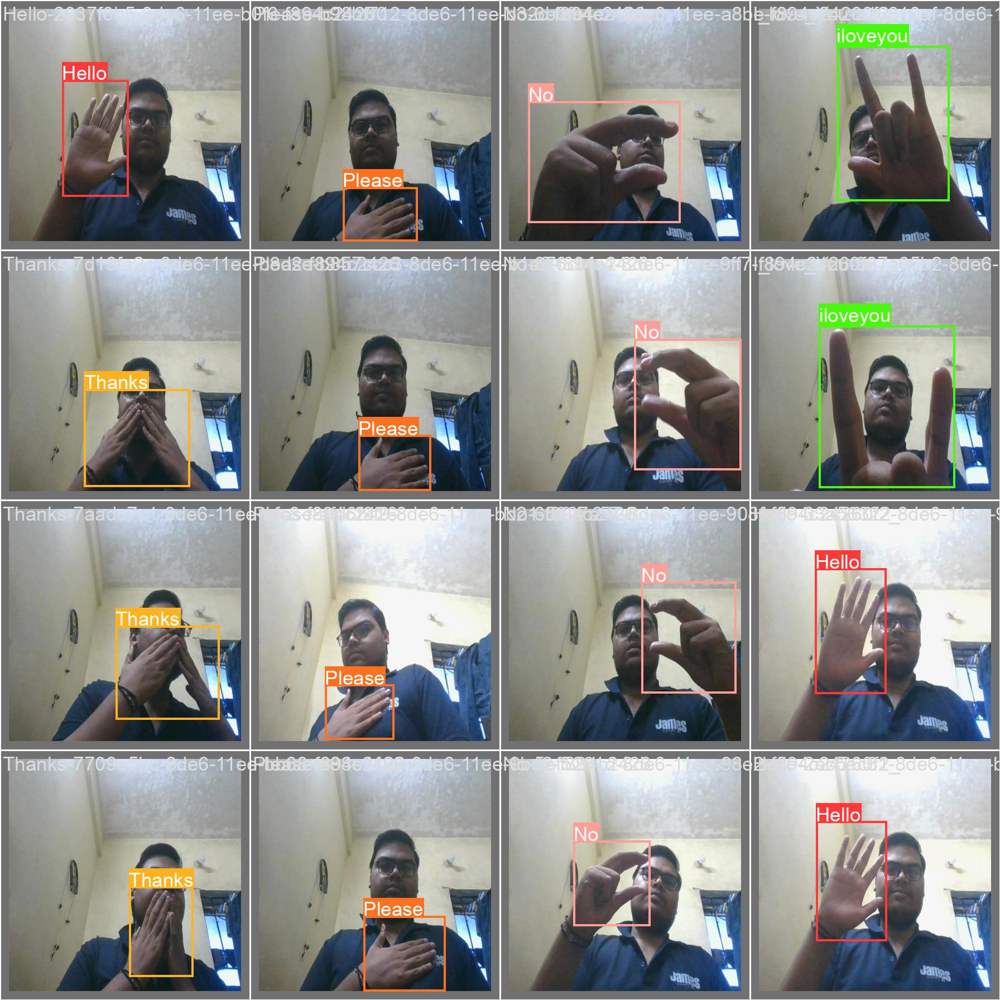

In [27]:
print("Ground Truth Training Data")
Image(filename = "/content/yolov5/runs/train/yolov5_results2/val_batch0_labels.jpg",width = 900)

Ground Truth Augmented Training Data


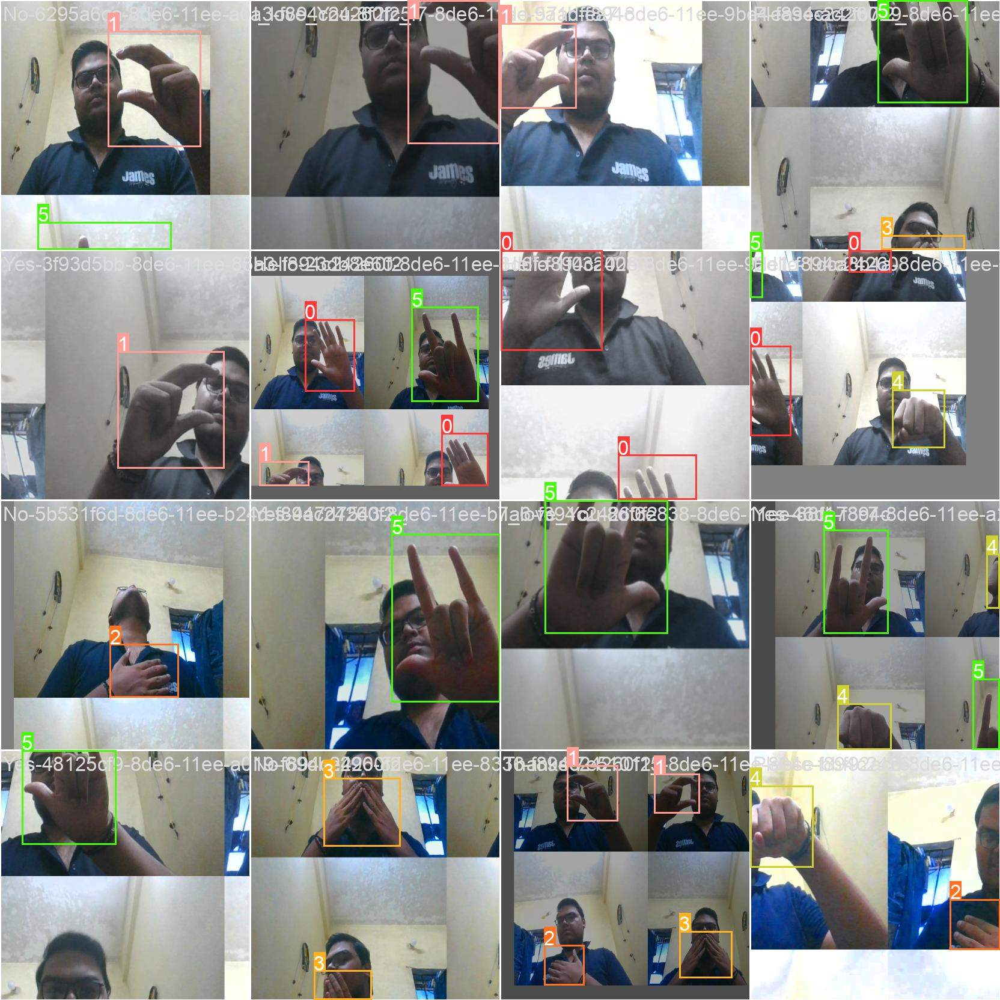

In [28]:
print("Ground Truth Augmented Training Data")
Image(filename = "/content/yolov5/runs/train/yolov5_results2/train_batch0.jpg",width = 900)

## Run inference with Trained Weights

In [29]:
%ls runs/

train/


In [30]:
%ls /content/yolov5/runs/train/yolov5_results2/weights

best.pt  last.pt


In [32]:
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5_results2/weights/best.pt --img 416 --conf 0.1 --source /content/annotated_data/test/images

/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5_results2/weights/best.pt'], source=/content/annotated_data/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-247-g3f02fde Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7260003 parameters, 0 gradients
image 1/20 /content/annotated_data/test/images/Hello-2037f8b5-8de6-11ee-b0f6-f894c24260f2_jpg.rf.26131f3fc3a69caa3a5637266fda53a1.jpg: 416x416 1 Hello, 9.0ms
image 2/20 /content/annotated_data/test/images/Hello-29edd62d-8de6-11ee-8ffa-f894c24260f2_jpg.rf.0477177bc499d51ae607

## Prediction

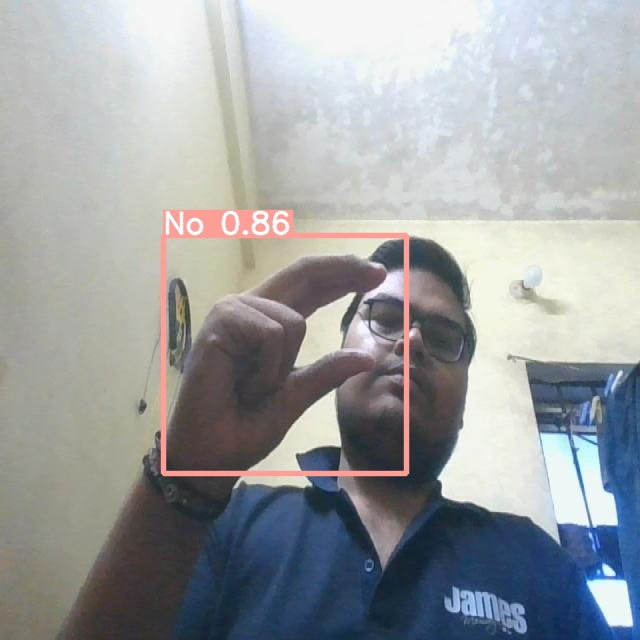

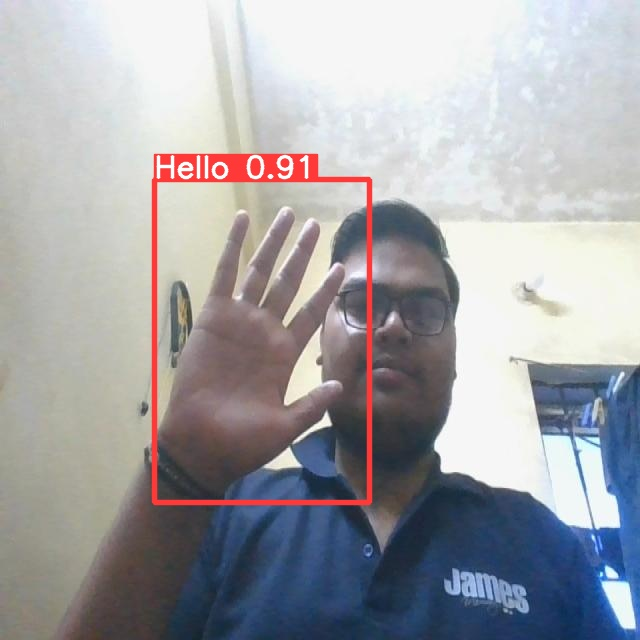

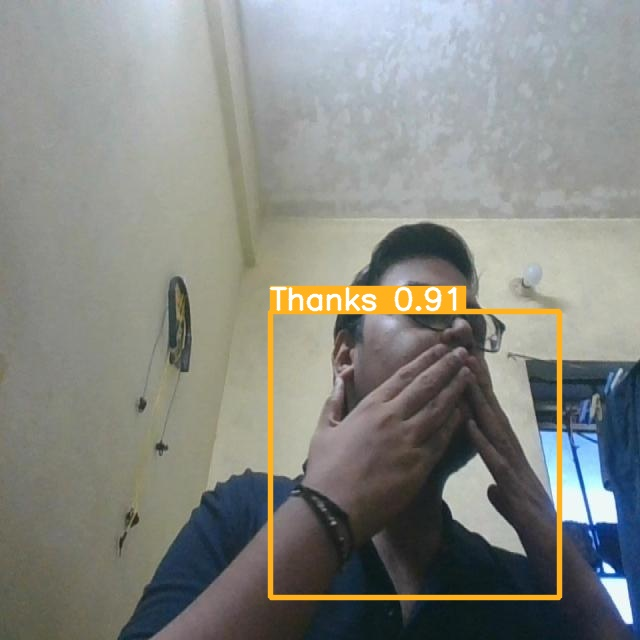

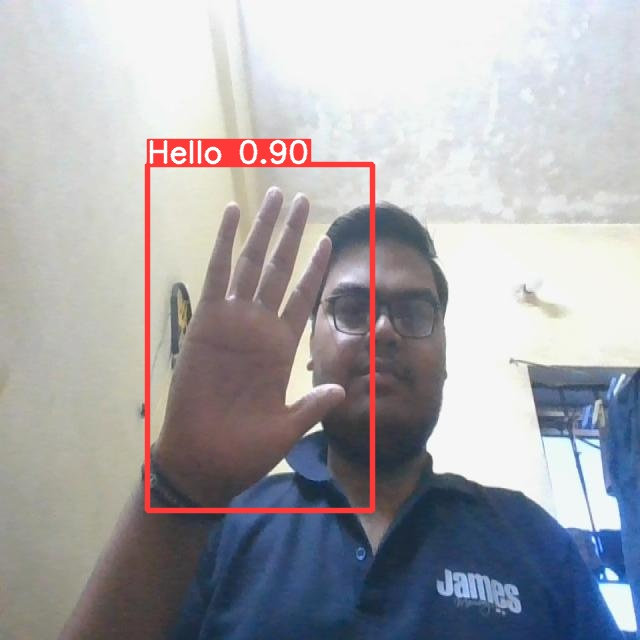

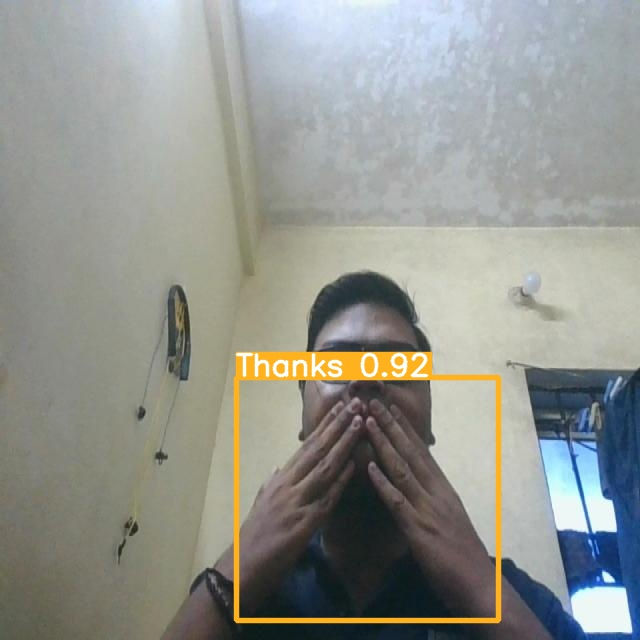

...

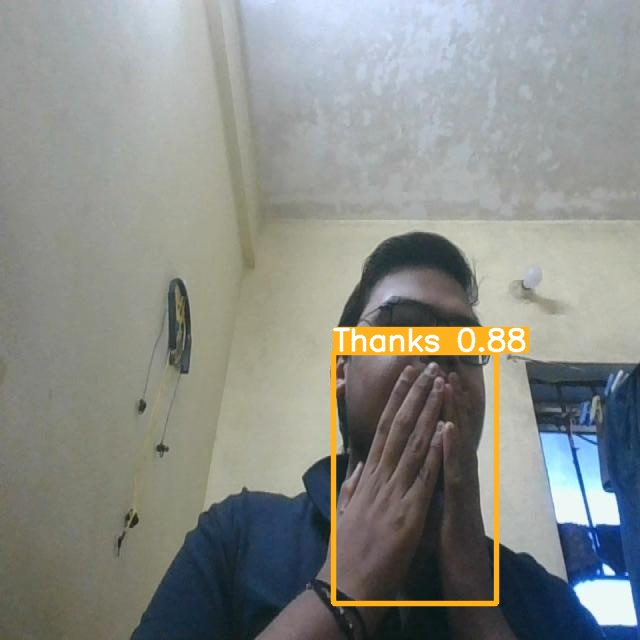

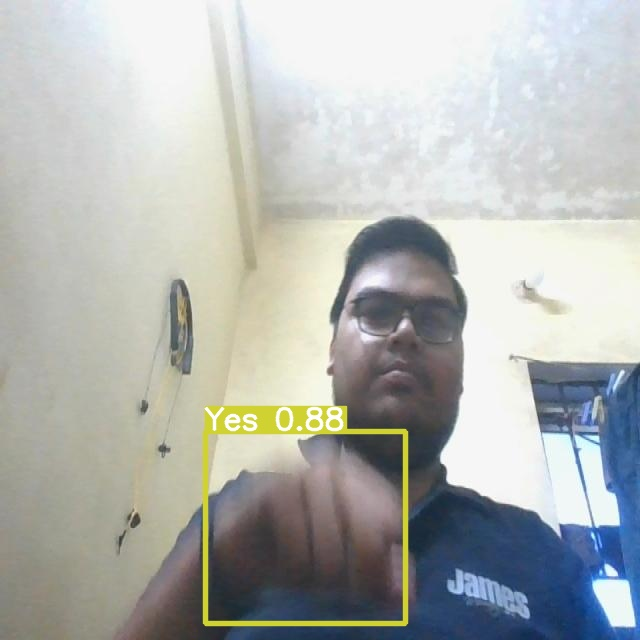

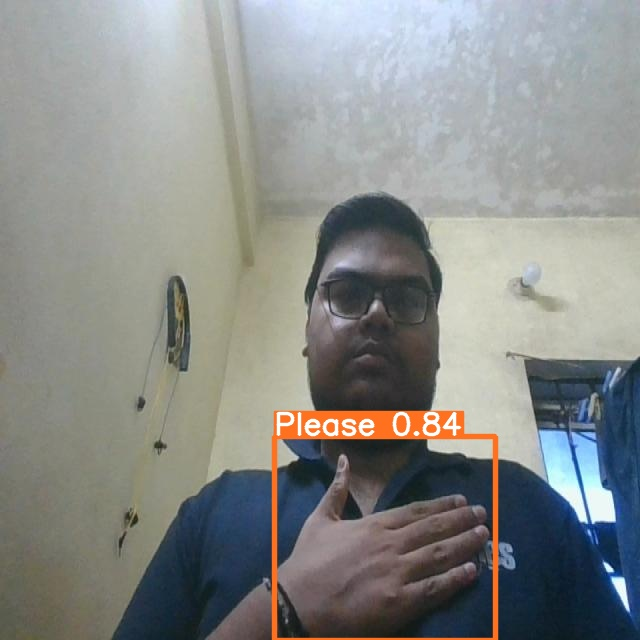

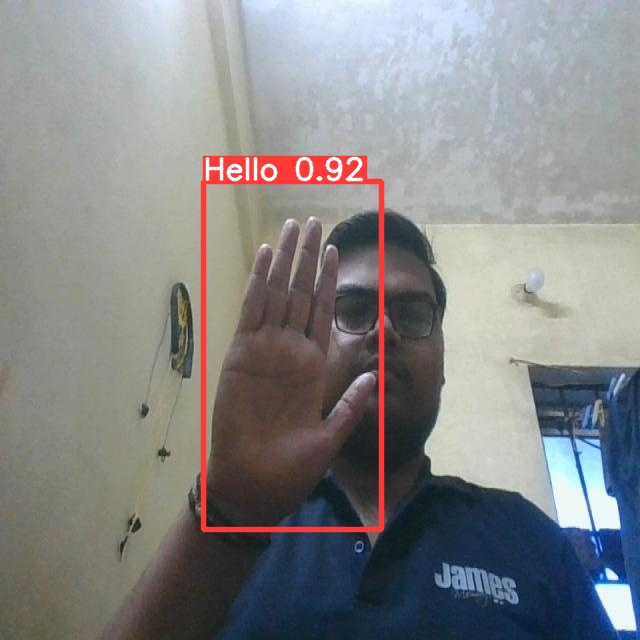

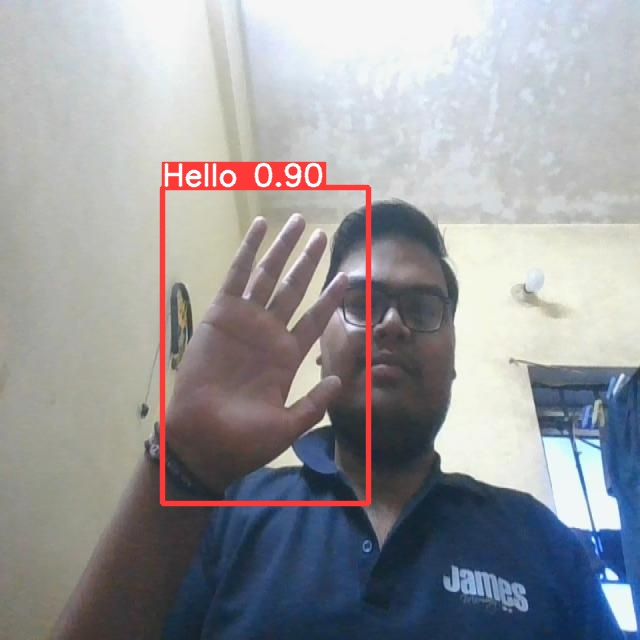

In [34]:
import glob
from IPython.display import Image,display

for imagename in glob.glob("/content/yolov5/runs/detect/exp2/*.jpg"):
  display(Image(filename = imagename))
  print("\n")

## Export Model

In [35]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
%cp /content/yolov5/runs/train/yolov5_results2/weights/best.pt /content/gdrive/MyDrive/Notebooks